In [1]:
import cv2
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
import numpy as np
import math
import random

In [2]:
%%shell
gdown 1l6XFCN4MRYiilzbWyxJ3pCgkBmimwDRC
gdown 1Lv2ZPBl9GBv52iBGVobkGL7CpLhRjtIL
gdown 1rDcMky6ORaAqCA_D9SQmv4oLL3WsFy4Y

gdown 1yR4SU8QAIIZKy_fcg8EVqyy7bQBUMkk8
gdown 1A5Fez3grSkv2gSmobQ2ZHTbF_OvNF0zg
gdown 17XiT3_YSVDeUxpSDWMb8cHO00k-98H75
gdown 1MOX9Xo6vScYSPXgQc-34nTasAX2jA18E
gdown 1weVtDFODJ-iZwwiPEYdflCPp_F9HPyFk

Downloading...
From: https://drive.google.com/uc?id=1l6XFCN4MRYiilzbWyxJ3pCgkBmimwDRC
To: /content/book.mov
100% 28.5M/28.5M [00:00<00:00, 48.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Lv2ZPBl9GBv52iBGVobkGL7CpLhRjtIL
To: /content/cv_cover.jpg
100% 117k/117k [00:00<00:00, 12.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=1rDcMky6ORaAqCA_D9SQmv4oLL3WsFy4Y
To: /content/ar_source.mov
100% 6.29M/6.29M [00:00<00:00, 19.1MB/s]
Downloading...
From: https://drive.google.com/uc?id=1yR4SU8QAIIZKy_fcg8EVqyy7bQBUMkk8
To: /content/pano_image1.jpg
100% 190k/190k [00:00<00:00, 58.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=1A5Fez3grSkv2gSmobQ2ZHTbF_OvNF0zg
To: /content/pano_image2.jpg
100% 191k/191k [00:00<00:00, 84.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=17XiT3_YSVDeUxpSDWMb8cHO00k-98H75
To: /content/shanghai-21.png
100% 232k/232k [00:00<00:00, 90.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1MOX9Xo6vScYSPXgQc-34nTasAX2jA18

## Part 1 : Augmented Reality with Planar Homographies

In [ ]:
def loadVid(path):
  # Create a VideoCapture object and read from input file
  # If the input is the camera, pass 0 instead of the video file name
  cap = cv2.VideoCapture(path)

  # Check if camera opened successfully
  if (cap.isOpened() == False): 
    print("Error opening video stream or file")

  frames = []
  i = 0
  # Read until video is completed
  while(cap.isOpened()):
    # Capture frame-by-frame
    i += 1
    ret, frame = cap.read()
    if ret == True:

      #Store the resulting frame
      if i == 1:
        frames = frame[np.newaxis, ...]
      else:
        frame = frame[np.newaxis, ...]
        frames = np.vstack([frames, frame])
        frames = np.squeeze(frames)

    else: 
      break

  # When everything done, release the video capture object
  cap.release()

  return frames

In [ ]:
book_img = cv2.imread("cv_cover.jpg", 0)
book_frames = loadVid("book.mov")

(641, 480, 640, 3)
(440, 350)


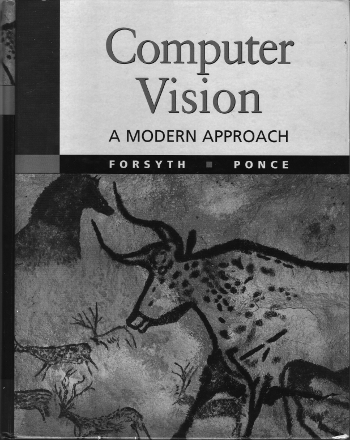

In [ ]:
print(book_frames.shape)
print(book_img.shape)
cv2_imshow(book_img)

In [ ]:
book_frames_gray = []
for x in book_frames:
  book_frames_gray.append(cv2.cvtColor(x , cv2.COLOR_BGR2GRAY))
print(np.shape(book_frames_gray))

(641, 480, 640)


### Getting Correspondences

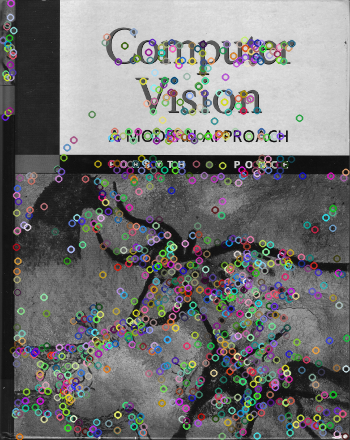

In [ ]:
sift = cv2.SIFT_create()
# book image
kp_img, des_img = sift.detectAndCompute(book_img, None)
book_img_c = book_img.copy()
book_img_c = cv2.drawKeypoints(book_img, kp_img, book_img_c)
cv2_imshow(book_img_c)

# book video frames
kp_list, des_list = [], []
for x in book_frames_gray:
  kp, des = sift.detectAndCompute(x, None)
  kp_list.append(kp)
  des_list.append(des)

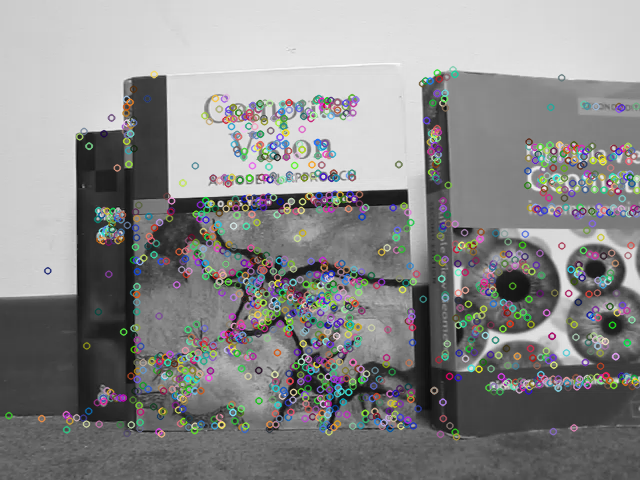

In [ ]:
frame_c = book_frames_gray[0].copy()
frame_c = cv2.drawKeypoints(book_frames_gray[0], kp_list[0], frame_c)
cv2_imshow(frame_c)

In [3]:
def get_good_matches(des1, des2, bf_matcher, k, ratio):
  matches = bf_matcher.knnMatch(des1, des2, k=k)

  good_matches_with_alpha = []
  for m, n in matches:
    alpha = m.distance / n.distance
    if alpha < ratio:
      good_matches_with_alpha.append([m, alpha])
  good_matches_with_alpha.sort(key = lambda x: x[1])
  good_matches = []

  for i in range(0, len(good_matches_with_alpha)):
    good_matches.append(good_matches_with_alpha[i][0])
  
  return good_matches

In [ ]:
bf = cv2.BFMatcher()
good_list = []
for x in des_list:
  good = get_good_matches(des_img, x, bf, 2, 0.35)
  good_list.append(good)

# good_list --> 641 element 
# good_list[i] --> list of good matches (cv2.DMatch) for book img and frame[i] 
# good_list[i][j] --> good match j from good matches of book img with frame[i]

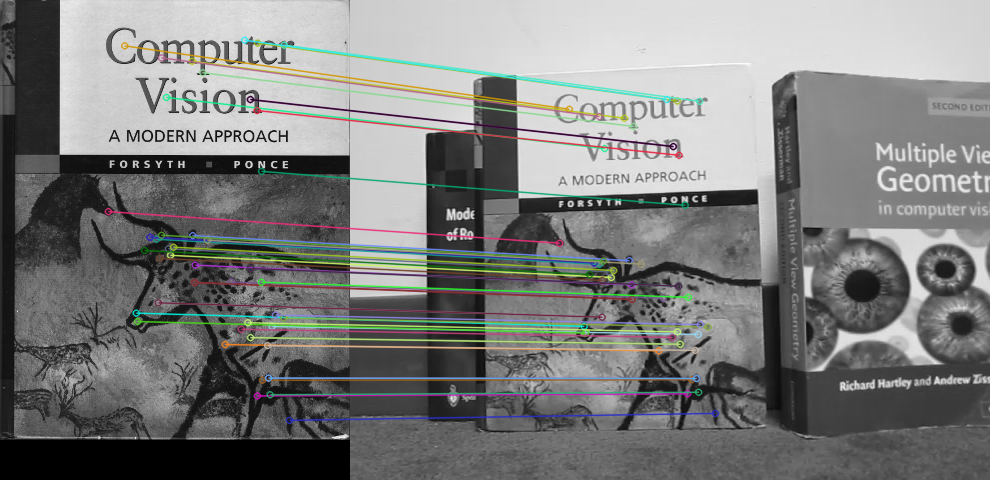

In [ ]:
matches_plot = cv2.drawMatchesKnn(book_img, kp_img, book_frames_gray[0], kp_list[0], [good_list[0][0:50]], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

cv2_imshow(matches_plot)

### Compute Homography Parameters

#### get correspondences 

In [4]:
def get_points_from_matches(matches_list, kp1, kp2):
  points_img1 = []
  points_img2 = []
  
  for match in matches_list:
    # queryIdx --> kp index for img1 
    x_img1 = kp1[match.queryIdx].pt[0]
    y_img1 = kp1[match.queryIdx].pt[1]
    points_img1.append([x_img1, y_img1])

    # trainIdx --> kp index for img2
    x_img2 = kp2[match.trainIdx].pt[0]
    y_img2 = kp2[match.trainIdx].pt[1]
    points_img2.append([x_img2, y_img2])
  
  return points_img1, points_img2

In [ ]:
points_in_img_list = []
points_in_frames_list = []

for frame_i, x in enumerate(good_list):
  # x: list of good matches for book_img with a frame of the book_video
  points_in_img , points_in_frame = get_points_from_matches(x, kp_img, kp_list[frame_i])
  points_in_img_list.append(points_in_img)
  points_in_frames_list.append(points_in_frame)

# points_in_img_list[i] and points_in_frames_list[i]
# are list of n points in img corresponding to list of n points in frame[i]
# where points_in_img_list[i][j] corresponds to points_in_frames_list[i][j]

##### homography

In [5]:
def compute_homography_matrix(points1, points2, no_of_points_used=50):
  A = []
  b = []

  for i in range(0, no_of_points_used):
    x, y = points1[i][0], points1[i][1]
    xd, yd = points2[i][0], points2[i][1]

    A.append([-1*x, -1*y, -1, 0, 0, 0, x*xd, y*xd])
    A.append([0, 0, 0, -1*x, -1*y, -1, x*yd, y*yd])    
    b.append([-xd])
    b.append([-yd])

  A = np.array(A)
  b = np.array(b)
  AT_A = A.T @ A
  AT_b = A.T @ b
  H = np.linalg.solve(AT_A, AT_b)

  return np.reshape(np.append(H, [1]), (3,3))

In [ ]:
# svd
# # will be called for every frame 
# def compute_homography_params(points_in_img, points_in_frame, no_of_points_used=50):
#   # form A
#   A = []
#   for i in range(0, no_of_points_used):
#     x = points_in_img[i][0]
#     y = points_in_img[i][1]
#     xd = points_in_frame[i][0]
#     yd = points_in_frame[i][1]
#     A.append([-1*x, -1*y, -1, 0, 0, 0, x*xd, y*xd, xd])
#     A.append([0, 0, 0, -1*x, -1*y, -1, x*yd, y*yd, yd])

#   # compute H vector
#   u, s, vh = np.linalg.svd(A)
#   # null_space = np.compress(s <= 1e-15, vh, axis=0)
#   # return np.reshape(np.array(null_space, dtype=np.float32), (3,3))
#   H = np.reshape(np.array(vh[-1] / vh[-1][-1], dtype=np.float32), (3,3))
#   return H

In [ ]:
H_list = []
for i, x in enumerate(points_in_frames_list):
  H_list.append(compute_homography_matrix(points_in_img_list[i], x, 22))

print(np.shape(H_list))

(641, 3, 3)


### Calculate Book Coordinates 

In [ ]:
# get the coordinates of the four corners of the book from each frame
top_left = [0, 0, 1]
bottom_left = [0, book_img.shape[0] - 1, 1]
bottom_right = [book_img.shape[1] - 1, book_img.shape[0] - 1, 1]
top_right = [book_img.shape[1] - 1, 0, 1]

four_corners_list = []

for i, frame in enumerate(book_frames_gray):
  tl = H_list[i] @ top_left
  bl = H_list[i] @ bottom_left
  br = H_list[i] @ bottom_right
  tr = H_list[i] @ top_right

  four_corners_list.append([tl / tl[-1], bl / bl[-1], br / br[-1], tr / tr[-1]])


In [ ]:
print(np.shape(four_corners_list))

(641, 4, 3)


### Crop AR Video Frames

In [ ]:
cropped_frames_list = []
cartoon_frames = loadVid("ar_source.mov")
print(cartoon_frames.shape)  
for i, frame in enumerate(cartoon_frames):
  x_min = min(four_corners_list[i][0][0], four_corners_list[i][1][0], four_corners_list[i][2][0], four_corners_list[i][3][0])
  x_max = max(four_corners_list[i][0][0], four_corners_list[i][1][0], four_corners_list[i][2][0], four_corners_list[i][3][0])
  width = (x_max - x_min)
  start = math.ceil((640 - width)/2)
  end = math.ceil(start + width)
  cropped_img = cartoon_frames[i][45 : 315, start : end]
  cropped_frames_list.append(cropped_img)

(511, 360, 640, 3)


### Overlay the First Frame of the Two Video

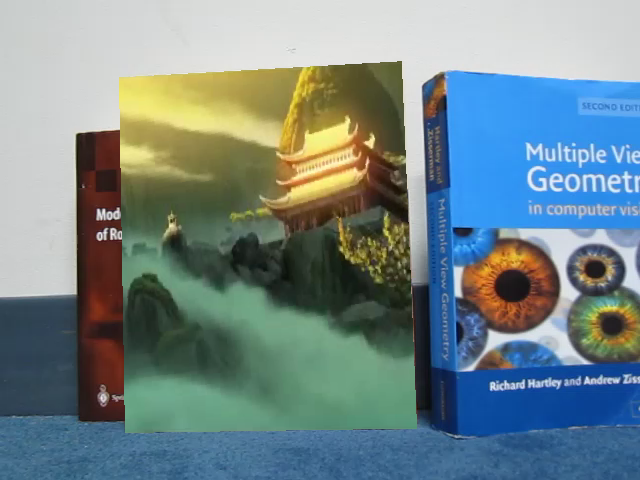

In [ ]:
def combine_frames(book_frame, cartoon_frame, h):
  cartoon_frame = cv2.resize(cartoon_frame, (350, 440))
  x = 350 - 1
  y = 440 - 1 
  for i in range(0, y):
    for j in range(0, x):
      point = H_list[h] @ np.array([j, i, 1])
      id_y = math.floor(point[0]/point[2])
      id_x = math.floor(point[1]/point[2])
      if id_x >= 0 and id_y >= 0:
        book_frame[id_x][id_y] = cartoon_frame[i][j]
  return book_frame
cv2_imshow(combine_frames(book_frames[0].copy(), cropped_frames_list[0], 0))

### Creating AR Application

In [ ]:
combined_videos_frames = []
for i, frame in enumerate(cropped_frames_list):
  combined_videos_frames.append(combine_frames(book_frames[i].copy(), cropped_frames_list[i], i))

In [ ]:
frameSize = (640, 480)
out = cv2.VideoWriter('output_video.mov',cv2.VideoWriter_fourcc(*'DIVX'), 25, frameSize)
for i, frame in enumerate(combined_videos_frames):
    out.write(combined_videos_frames[i])
out.release()

## Part 2: Image Mosaics

###  Getting Correspondences and Compute the Homography Parameters

In [6]:
pano_img_1 = cv2.imread("pano_image1.jpg", 0)
pano_img_2 = cv2.imread("pano_image2.jpg", 0)
pano_img_1_BGR = cv2.imread("pano_image1.jpg")
pano_img_2_BGR = cv2.imread("pano_image2.jpg")

In [7]:
def get_kp_des(img):
  stitch = cv2.SIFT_create()
  kp, des = stitch.detectAndCompute(img, None) 
  return kp, des

In [8]:
kp_img1, des_img1 = get_kp_des(pano_img_1) 
kp_img2, des_img2 = get_kp_des(pano_img_2)

In [9]:
bf_matcher = cv2.BFMatcher()
good_matches = get_good_matches(des_img1, des_img2, bf_matcher, k=2, ratio=0.4)
print(np.shape(good_matches))

(481,)


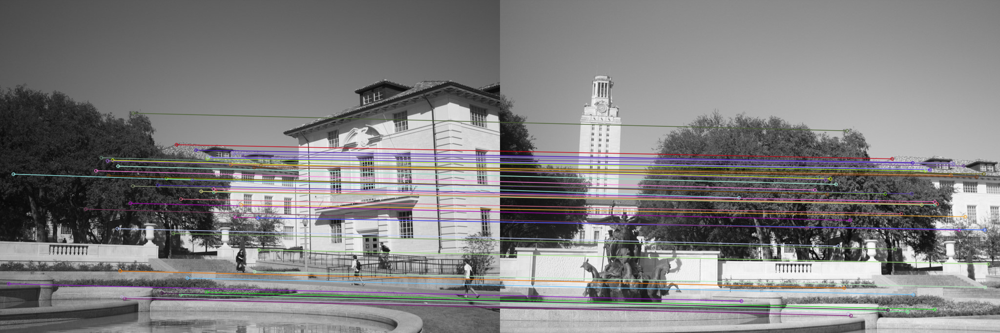

In [10]:
matches_plot_stitch = cv2.drawMatchesKnn(pano_img_1, kp_img1, pano_img_2, kp_img2, [good_matches[0:50]], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

cv2_imshow(matches_plot_stitch)

In [11]:
points_img1, points_img2 = get_points_from_matches(good_matches, kp_img1, kp_img2)

In [12]:
H = compute_homography_matrix(points_img1, points_img2)

In [ ]:
print(H)

[[ 7.64254162e-01  3.86235402e-02  4.47127660e+02]
 [-1.36072520e-01  9.12794839e-01  7.61056044e+01]
 [-2.11395122e-04 -3.13114690e-05  1.00000000e+00]]


### Warping Between Image Planes

In [13]:
def create_before_warping(img):
  first = np.full_like(np.zeros(img.shape[1]), 0)
  for i in range (1, img.shape[0]):
    first = np.append(first, np.full_like(np.zeros(img.shape[1]), i))
  first = np.reshape(first, (1, len(first)))

  middle = np.arange(img.shape[1])
  for i in range (1, img.shape[0]):
    middle = np.append(middle, np.arange(img.shape[1]))
  middle = np.reshape(middle, (1, len(middle)))

  last = np.full_like(np.arange(img.shape[0] * img.shape[1]), 1)
  last = np.reshape(last, (1, len(last)))
  before_warping = np.array(np.append(np.append(middle, first, axis=0), last, axis=0), dtype=int)
  
  return before_warping

In [ ]:
def warping(H, img):
  before_warping = create_before_warping(img)
  after_warping = H @ before_warping
  after_warping = after_warping/after_warping[2][np.newaxis, :]

  # shift x , y
  min_val = np.amin(after_warping, axis=1) # min_val[0] = min y , min_val[1] = min x
  after_warping[0] -= min_val[0]
  after_warping[1] -= min_val[1]

  after_warping_rounded = np.array(after_warping, dtype=int)

  max_val = np.amax(after_warping_rounded, axis=1)
  warped_img = np.zeros((max_val[1] + 1, max_val[0] + 1, 3), dtype=np.ubyte)

  # forward warping
  for i in range(0, img.shape[0]):
    for j in range(0, img.shape[1]):
      y = after_warping_rounded[0][i*img.shape[1] + j]
      x = after_warping_rounded[1][i*img.shape[1] + j]
      warped_img[x,y] = img[i,j] 

  # inverse warping
  h, w, _ = img.shape
  H_inverse = np.linalg.inv(H)
  for i in range(warped_img.shape[0]):
    for j in range(warped_img.shape[1]):
      if (not warped_img[i][j][0] and not warped_img[i][j][1] and not warped_img[i][j][2]):
        xd = j + min_val[0]
        yd = i + min_val[1]
        src = np.matmul(H_inverse, [[xd], [yd], [1]])
        src /= src[-1]

        rf, rc = math.floor(src[1]), math.ceil(src[1])
        cf, cc = math.floor(src[0]), math.ceil(src[0])

        q1 = img[rf][cf] if (rf >= 0 and rf < h) and (cf >= 0 and cf < w) else 0
        q2 = img[rf][cc] if (rf >= 0 and rf < h) and (cc >= 0 and cc < w) else 0
        q3 = img[rc][cf] if (rc >= 0 and rc < h) and (cf >= 0 and cf < w) else 0
        q4 = img[rc][cc] if (rc >= 0 and rc < h) and (cc >= 0 and cc < w) else 0

        q1_portion = abs(src[1] - rc) * abs(src[0] - cc) * q1
        q2_portion = abs(src[1] - rc) * abs(src[0] - cf) * q2
        q3_portion = abs(src[1] - rf) * abs(src[0] - cc) * q3
        q4_portion = abs(src[1] - rf) * abs(src[0] - cf) * q4

        warped_img[i][j] = q1_portion + q2_portion + q3_portion + q4_portion

  return min_val, warped_img

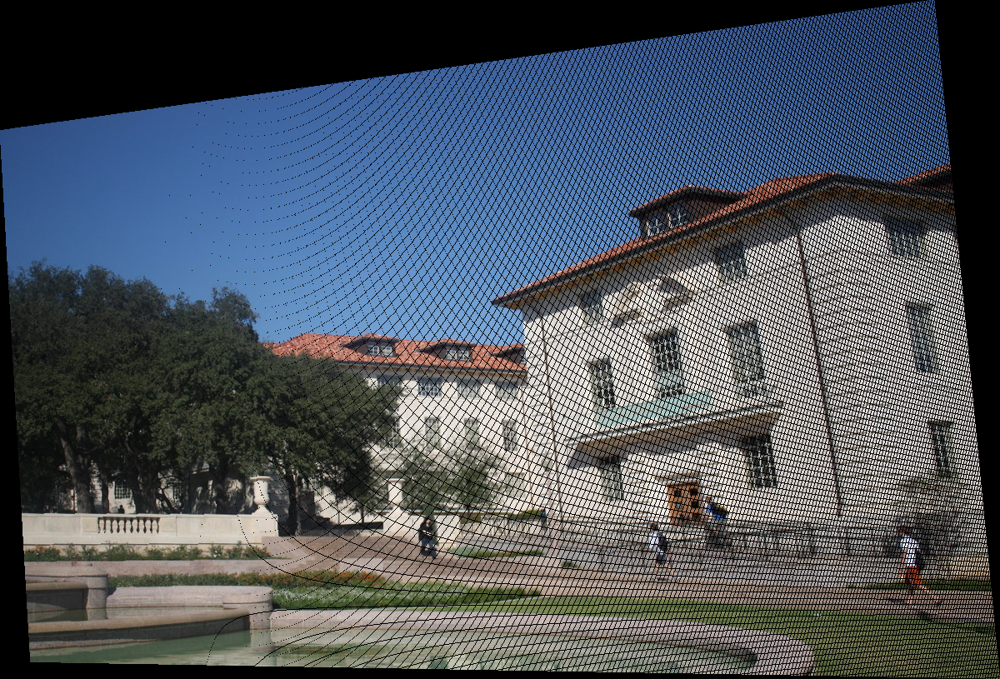

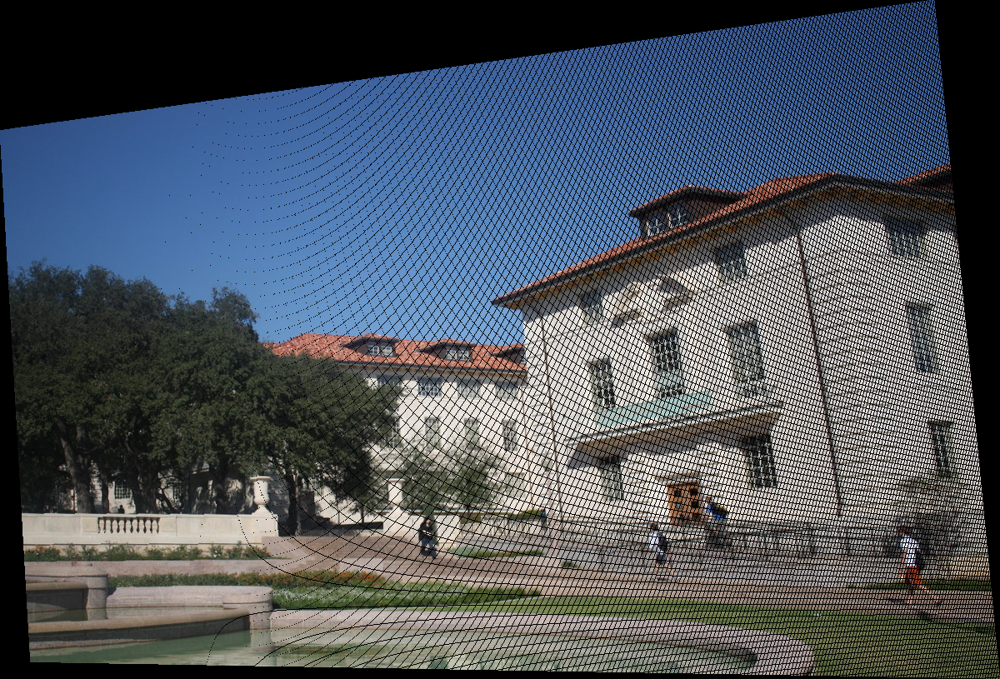

In [ ]:
min_val, warped_img = warping(H, pano_img_1_BGR)
cv2_imshow(warped_img)

### Create the Output Mosaic

In [ ]:
def create_mosaic(img1, img2, min_val):
  rows = max(img1.shape[0], img2.shape[0], math.ceil(img1.shape[0] - min_val[1]), math.ceil(img2.shape[0] + min_val[1]))
  cols = max(img1.shape[1], img2.shape[1], math.ceil(img1.shape[1] - min_val[0]), math.ceil(img2.shape[1] + min_val[0]))

  mosaic_img = np.zeros((rows, cols, 3), dtype=np.ubyte)

  shift_x, shift_y = max(0, round(min_val[0])), max(0, round(min_val[1]))
  mosaic_img[shift_y : shift_y + img2.shape[0], shift_x : shift_x + img2.shape[1]] = img2

  shift_x, shift_y = max(0, round(-min_val[0])), max(0, round(-min_val[1]))
  mosaic_img[shift_y : shift_y + img1.shape[0], shift_x : shift_x + img1.shape[1]] = img1

  return mosaic_img

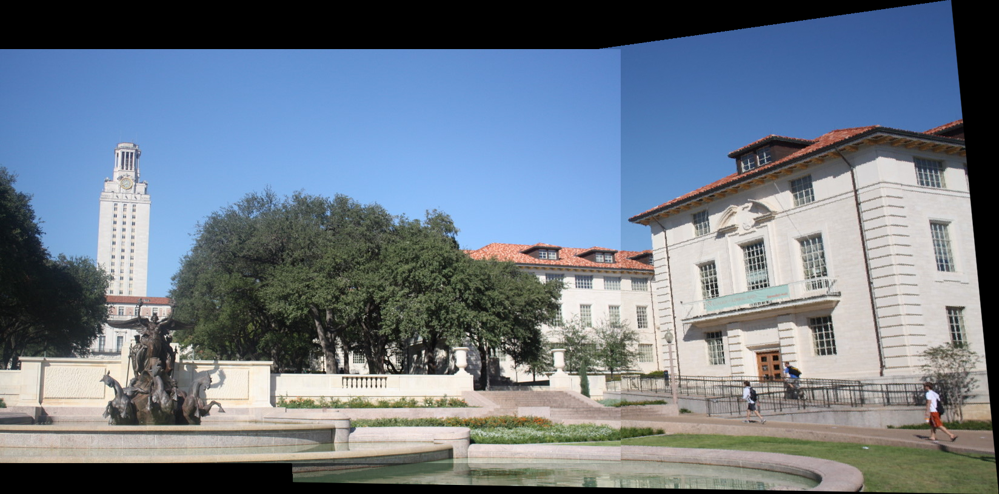

In [ ]:
mosaic_img = create_mosaic(pano_img_2_BGR, warped_img, min_val)
cv2_imshow(mosaic_img)

## Bonus

In [ ]:
shanghai_21 = cv2.imread("shanghai-21.png")
shanghai_21_g = cv2.imread("shanghai-21.png", 0)
shanghai_22 = cv2.imread("shanghai-22.png")
shanghai_22_g = cv2.imread("shanghai-22.png", 0)
shanghai_23 = cv2.imread("shanghai-23.png")
shanghai_23_g = cv2.imread("shanghai-23.png", 0)

In [ ]:
kp_21, des_21 = get_kp_des(shanghai_21_g)
kp_22, des_22 = get_kp_des(shanghai_22_g)
kp_23, des_23 = get_kp_des(shanghai_23_g)

##### 21 and 22

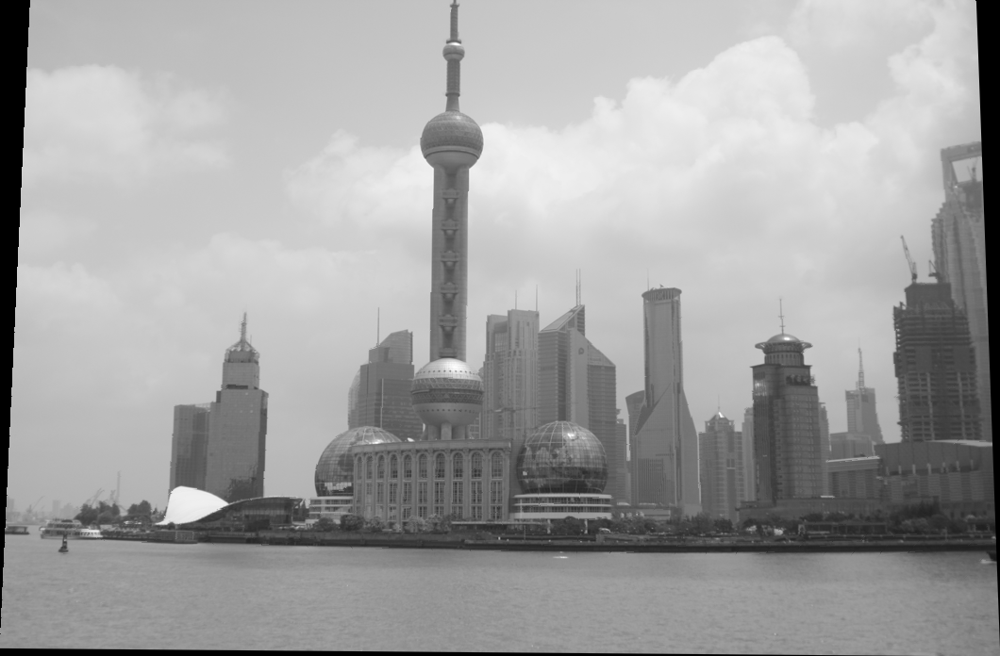

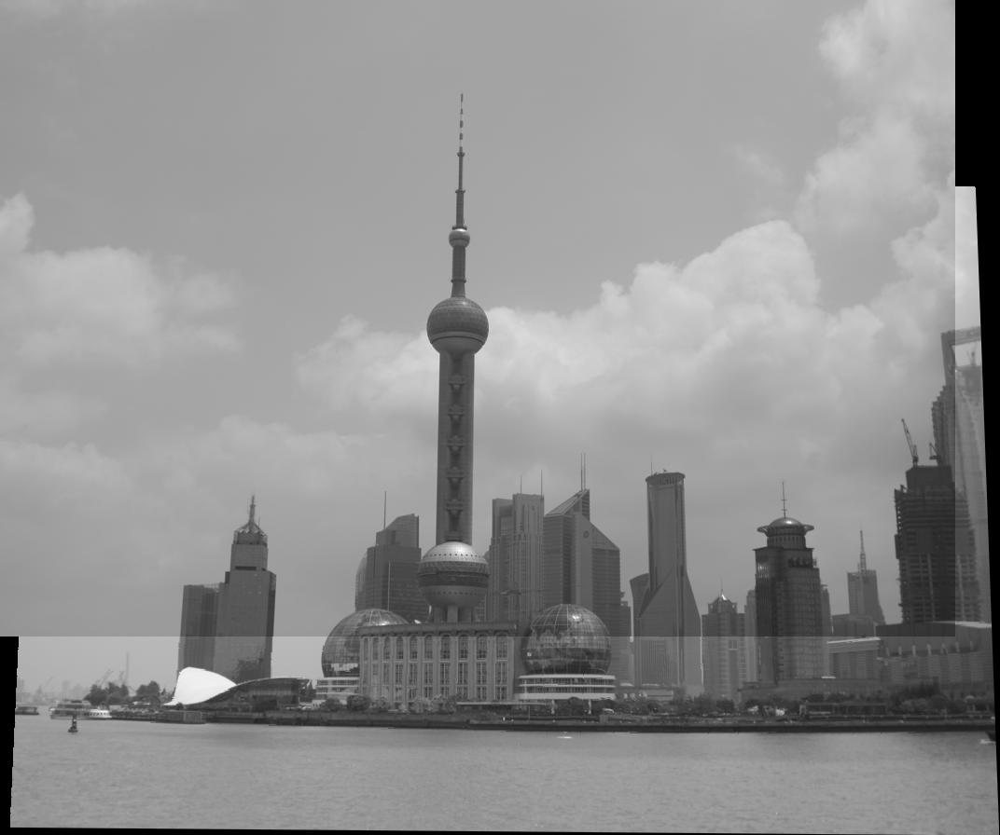

In [ ]:
bf_matcher = cv2.BFMatcher()
good_matches_21_22 = get_good_matches(des_21, des_22, bf_matcher, k=2, ratio=0.4)
points_21, points_22 = get_points_from_matches(good_matches_21_22, kp_21, kp_22)
H_21_22 = compute_homography_matrix(points_21, points_22)
min_val_21_22, warped_img_21 = warping(H_21_22, shanghai_21)
cv2_imshow(warped_img_21)
mosaic_21_22 = create_mosaic(shanghai_22, warped_img_21, min_val_21_22)
cv2_imshow(mosaic_21_22)

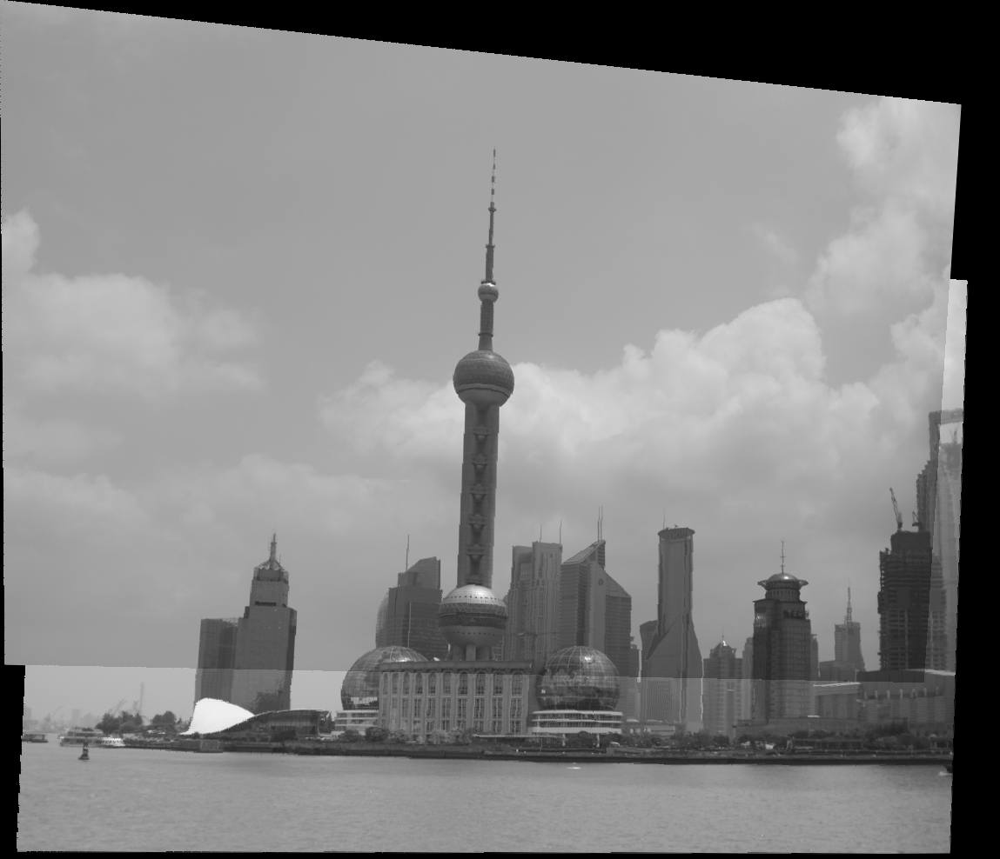

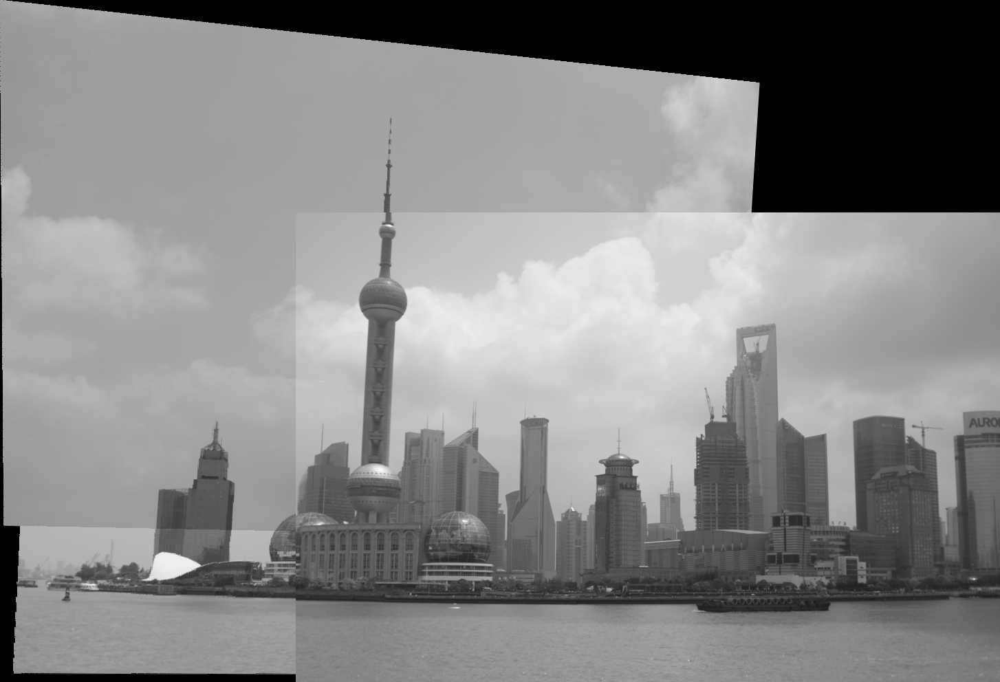

In [ ]:
kp_21_22, des_21_22 = get_kp_des(cv2.cvtColor(mosaic_21_22, cv2.COLOR_BGR2GRAY))
good_matches_21_22_23 = get_good_matches(des_21_22, des_23, bf_matcher, k=2, ratio=0.4)
points_21_22, points_23 = get_points_from_matches(good_matches_21_22_23, kp_21_22, kp_23)
H_21_22_23 = compute_homography_matrix(points_21_22, points_23)
min_val_21_22_23, warped_img_21_22 = warping(H_21_22_23, mosaic_21_22)
cv2_imshow(warped_img_21_22)
mosaic_21_22_23 = create_mosaic(shanghai_23, warped_img_21_22, min_val_21_22_23)
cv2_imshow(mosaic_21_22_23)